# An Extensive Exploratory Data Analysis on Apple Stock Prices

### Team Members
- Group member 1
    - Name: Adan Ordonez
    - Email: aeo49@drexel.edu
- Group member 2
    - Name: Priyanka Patil
    - Email: pp673@drexel.edu
- Group member 3
    - Name: Tyler Brenner
    - Email: tb3327@drexel.edu
- Group member 4
    - Name: Vijval Vemula
    - Email: vv354@drexel.edu

### Background for our analysis:

We have chosen to perform an extensive EDA on the stock prices of the apple company from 1980 - 2022, for which the CSV file is available [here](https://drexel0-my.sharepoint.com/:x:/r/personal/vv354_drexel_edu/_layouts/15/Doc.aspx?sourcedoc=%7BEA5B7A5B-F415-4975-BE7A-7A4330864DD3%7D&file=AAPL%201.xlsx&action=default&mobileredirect=true). We downloaded the file from [Kaggle](https://www.kaggle.com/datasets/meetnagadia/apple-stock-price-from-19802021). This analysis of the Apple stock price data aims to provide valuable insights and support for investors, financial analysts, and traders. By visualizing the stock price trends, calculating summary statistics, and examining daily returns, it helps in understanding the historical performance and volatility of Apple stock. By analyzing significant events and outlier detection, the analysis contributes to making informed investment decisions. Moreover, volatility analysis and technical indicators provide additional tools for risk assessment and identifying potential buy/sell signals. Overall, this comprehensive analysis assists stakeholders in better understanding the historical behavior of Apple stock, potentially identifying profitable opportunities, and mitigating risks in their investment strategies. 

In [123]:
%autosave 60

Autosaving every 60 seconds


### Initial EDA:

Our initial analysis on the graph would be getting a sense of the data we have and exploring its statistical traits. Here are some questions we expect to be answered from this approach:

*1. What does the overall data structure look like?*
   
*2. Are there any missing values in the dataset?*
   
*3. What are the summary statistics of the numerical columns?*
  
*4. What is the general trend of the stock's closing price over time?*

*5. How do the Open, High, Low, and Close prices vary over time?*

*6. What does the volume of trades look like over time?*



In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline


In [125]:
path = "apple_stock_prices.csv"

In [127]:

data = pd.read_csv(path, parse_dates = ["Date"], index_col = "Date")
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
12-12-1980,0.128348,0.128906,0.128348,0.128348,0.100178,469033600
15-12-1980,0.122210,0.122210,0.121652,0.121652,0.094952,175884800
16-12-1980,0.113281,0.113281,0.112723,0.112723,0.087983,105728000
17-12-1980,0.115513,0.116071,0.115513,0.115513,0.090160,86441600
18-12-1980,0.118862,0.119420,0.118862,0.118862,0.092774,73449600
19-12-1980,0.126116,0.126674,0.126116,0.126116,0.098436,48630400
22-12-1980,0.132254,0.132813,0.132254,0.132254,0.103227,37363200
23-12-1980,0.137835,0.138393,0.137835,0.137835,0.107583,46950400
24-12-1980,0.145089,0.145647,0.145089,0.145089,0.113245,48003200


In [128]:
data.shape

(10468, 6)

In [129]:
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [130]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,10468.000000,10468.000000,10468.000000,10468.000000,10468.000000,1.046800e+04
mean,14.757987,14.921491,14.594484,14.763533,14.130431,3.308489e+08
std,31.914174,32.289158,31.543959,31.929489,31.637275,3.388418e+08
min,0.049665,0.049665,0.049107,0.049107,0.038329,0.000000e+00
25%,0.283482,0.289286,0.276786,0.283482,0.235462,1.237768e+08
50%,0.474107,0.482768,0.465960,0.475446,0.392373,2.181592e+08
75%,14.953303,15.057143,14.692589,14.901964,12.835269,4.105794e+08
max,182.630005,182.940002,179.119995,182.009995,181.511703,7.421641e+09


In [131]:
data.dtypes

Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [132]:
data.index

Index(['12-12-1980', '15-12-1980', '16-12-1980', '17-12-1980', '18-12-1980',
       '19-12-1980', '22-12-1980', '23-12-1980', '24-12-1980', '26-12-1980',
       ...
       '06-06-2022', '07-06-2022', '08-06-2022', '09-06-2022', '10-06-2022',
       '13-06-2022', '14-06-2022', '15-06-2022', '16-06-2022', '17-06-2022'],
      dtype='object', name='Date', length=10468)

In [133]:
data.index = pd.to_datetime(data.index, format = "mixed")

data.index = pd.to_datetime(data.index, format = "%y-%m-%d")
data.index

DatetimeIndex(['1980-12-12', '1980-12-15', '1980-12-16', '1980-12-17',
               '1980-12-18', '1980-12-19', '1980-12-22', '1980-12-23',
               '1980-12-24', '1980-12-26',
               ...
               '2022-06-06', '2022-07-06', '2022-08-06', '2022-09-06',
               '2022-10-06', '2022-06-13', '2022-06-14', '2022-06-15',
               '2022-06-16', '2022-06-17'],
              dtype='datetime64[ns]', name='Date', length=10468, freq=None)

In [136]:
data = data.sort_index(axis = 0)
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1980-12-12,0.128348,0.128906,0.128348,0.128348,0.100178,469033600
1980-12-15,0.122210,0.122210,0.121652,0.121652,0.094952,175884800
1980-12-16,0.113281,0.113281,0.112723,0.112723,0.087983,105728000
1980-12-17,0.115513,0.116071,0.115513,0.115513,0.090160,86441600
1980-12-18,0.118862,0.119420,0.118862,0.118862,0.092774,73449600
1980-12-19,0.126116,0.126674,0.126116,0.126116,0.098436,48630400
1980-12-22,0.132254,0.132813,0.132254,0.132254,0.103227,37363200
1980-12-23,0.137835,0.138393,0.137835,0.137835,0.107583,46950400
1980-12-24,0.145089,0.145647,0.145089,0.145089,0.113245,48003200


In [137]:
data.apply(pd.isnull).sum()

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [138]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10468 entries, 1980-12-12 to 2022-12-05
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       10468 non-null  float64
 1   High       10468 non-null  float64
 2   Low        10468 non-null  float64
 3   Close      10468 non-null  float64
 4   Adj Close  10468 non-null  float64
 5   Volume     10468 non-null  int64  
dtypes: float64(5), int64(1)
memory usage: 572.5 KB


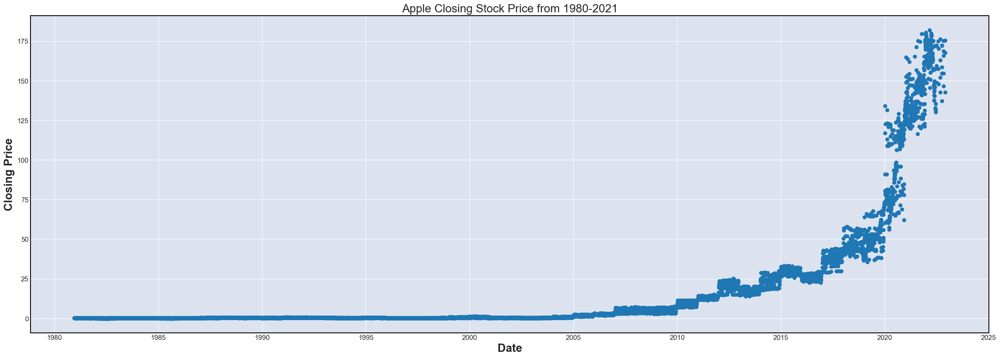

In [139]:
plt.figure(figsize=(30, 10))  # Adjust the figure size to make it wider
# Get the adjusted closing price of Apple stock

# Plot the time series graph
bar_width = 1.0
plt.scatter(data.index,data["Close"],label='Close')
plt.title("Apple Closing Stock Price from 1980-2021", fontsize=20)
plt.xlabel("Date", fontsize=20)
plt.ylabel("Closing Price", fontsize=20)
plt.show()

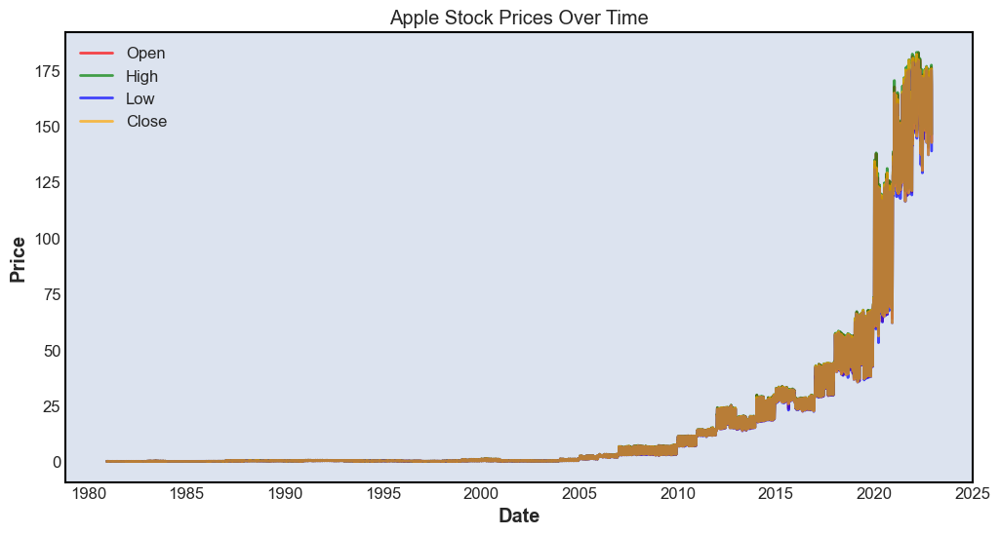

In [140]:
plt.figure(figsize=(12, 6))  # Adjust the figure size to make it broader

plt.plot(data.index, data['Open'], label='Open', color='r', alpha=0.7, linewidth=2)
plt.plot(data.index, data['High'], label='High', color='g', alpha=0.7, linewidth=2)
plt.plot(data.index, data['Low'], label='Low', color='b', alpha=0.7, linewidth=2)
plt.plot(data.index, data['Close'], label='Close', color='orange', alpha=0.7, linewidth=2)

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Apple Stock Prices Over Time')
plt.legend()
plt.grid(False)
plt.show()


The rapid increase in Apple's stock price from 2010 to 2022 can be attributed to several key factors:  

__1. *Strong Product Portfolio*__: Apple introduced several successful products during this period, including the iPhone, iPad, MacBook, and Apple Watch. These products generated significant revenue and contributed to the company's overall growth.  

__2. *iPhone Sales*__: The iPhone, in particular, played a crucial role in Apple's growth story. It became one of the most popular smartphones globally, leading to substantial sales and profits for the company.  

__3. *Stock Splits*__: In August 2020, Apple implemented a 4-for-1 stock split. Stock splits increase the number of shares outstanding while decreasing the share price proportionally. This move made individual shares more affordable to investors and likely contributed to increased demand.  

__4. *Market Sentiment*__: Positive market sentiment and investor optimism about the company's future prospects also played a role in driving up the stock price. 

__5. *Innovative Leadership*__: Under the leadership of Steve Jobs, and later Tim Cook, Apple continued to innovate and maintain its reputation as a leading technology company. 

In [141]:
type(data.index) 

pandas.core.indexes.datetimes.DatetimeIndex

C:\Users\venkat\anaconda3\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


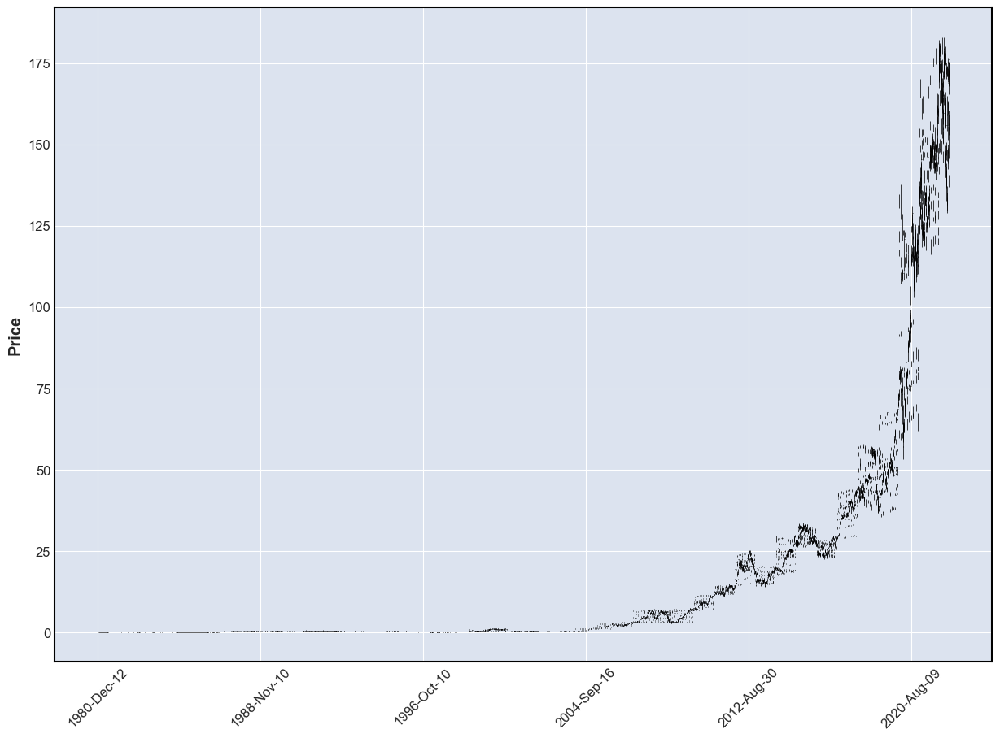

In [142]:
import mplfinance as mpl

mpl.plot(data, figscale = 2.0)


In [143]:
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1980-12-12,0.128348,0.128906,0.128348,0.128348,0.100178,469033600
1980-12-15,0.122210,0.122210,0.121652,0.121652,0.094952,175884800
1980-12-16,0.113281,0.113281,0.112723,0.112723,0.087983,105728000
1980-12-17,0.115513,0.116071,0.115513,0.115513,0.090160,86441600
1980-12-18,0.118862,0.119420,0.118862,0.118862,0.092774,73449600
1980-12-19,0.126116,0.126674,0.126116,0.126116,0.098436,48630400
1980-12-22,0.132254,0.132813,0.132254,0.132254,0.103227,37363200
1980-12-23,0.137835,0.138393,0.137835,0.137835,0.107583,46950400
1980-12-24,0.145089,0.145647,0.145089,0.145089,0.113245,48003200


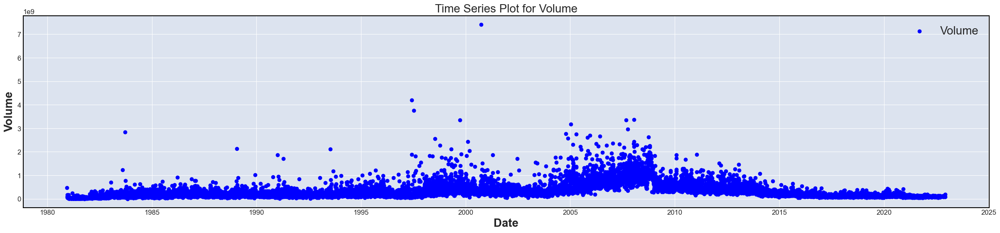

In [144]:
plt.figure(figsize=(30, 6))
plt.scatter(data.index, data['Volume'], marker='o', linestyle='-', color='b', label='Volume')
plt.xlabel('Date', fontsize=20)  
plt.ylabel('Volume', fontsize=20)  
plt.title('Time Series Plot for Volume', fontsize=20)  
plt.legend(fontsize=20)

plt.show()

In [145]:
data['mean_of_prices'] = data[['Open', 'High', 'Low', 'Close', 'Adj Close']].mean(axis=1)
data.head()


,Open,High,Low,Close,Adj Close,Volume,mean_of_prices
Date,,,,,,,
1980-12-12,0.128348,0.128906,0.128348,0.128348,0.100178,469033600,0.122826
1980-12-15,0.122210,0.122210,0.121652,0.121652,0.094952,175884800,0.116535
1980-12-16,0.113281,0.113281,0.112723,0.112723,0.087983,105728000,0.107998
1980-12-17,0.115513,0.116071,0.115513,0.115513,0.090160,86441600,0.110554
1980-12-18,0.118862,0.119420,0.118862,0.118862,0.092774,73449600,0.113756


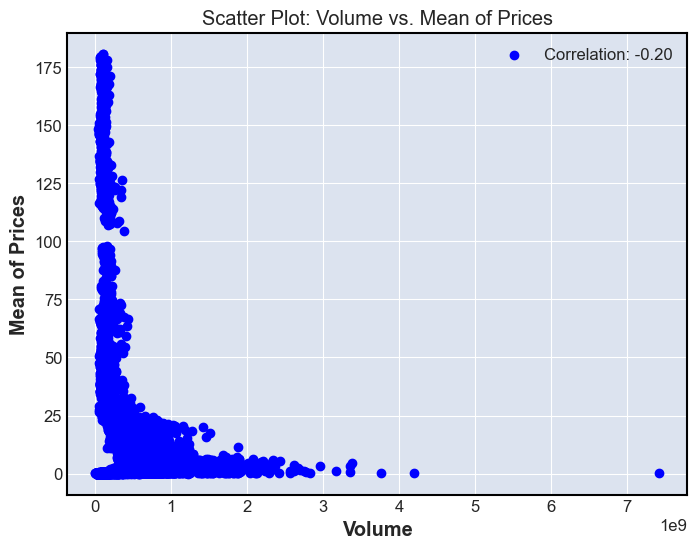

In [146]:
correlation = data['Volume'].corr(data['mean_of_prices'])

plt.figure(figsize=(8, 6))
plt.scatter(data['Volume'], data['mean_of_prices'], color='b', label=f'Correlation: {correlation:.2f}')
plt.xlabel('Volume')
plt.ylabel('Mean of Prices')
plt.title('Scatter Plot: Volume vs. Mean of Prices')
plt.legend()
plt.grid(True)

plt.show()

In [147]:
data = data.drop('mean_of_prices', axis=1)


In [148]:
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1980-12-12,0.128348,0.128906,0.128348,0.128348,0.100178,469033600
1980-12-15,0.122210,0.122210,0.121652,0.121652,0.094952,175884800
1980-12-16,0.113281,0.113281,0.112723,0.112723,0.087983,105728000
1980-12-17,0.115513,0.116071,0.115513,0.115513,0.090160,86441600
1980-12-18,0.118862,0.119420,0.118862,0.118862,0.092774,73449600


In [149]:
data.fillna(0, inplace=True)

In [150]:
data['Daily Return']= data['Close'].pct_change()

In [151]:
data = data.dropna()

In [152]:
data.shape

(10467, 7)

In [153]:
data.head()

,Open,High,Low,Close,Adj Close,Volume,Daily Return
Date,,,,,,,
1980-12-15,0.122210,0.122210,0.121652,0.121652,0.094952,175884800,-0.052171
1980-12-16,0.113281,0.113281,0.112723,0.112723,0.087983,105728000,-0.073398
1980-12-17,0.115513,0.116071,0.115513,0.115513,0.090160,86441600,0.024751
1980-12-18,0.118862,0.119420,0.118862,0.118862,0.092774,73449600,0.028992
1980-12-19,0.126116,0.126674,0.126116,0.126116,0.098436,48630400,0.061029


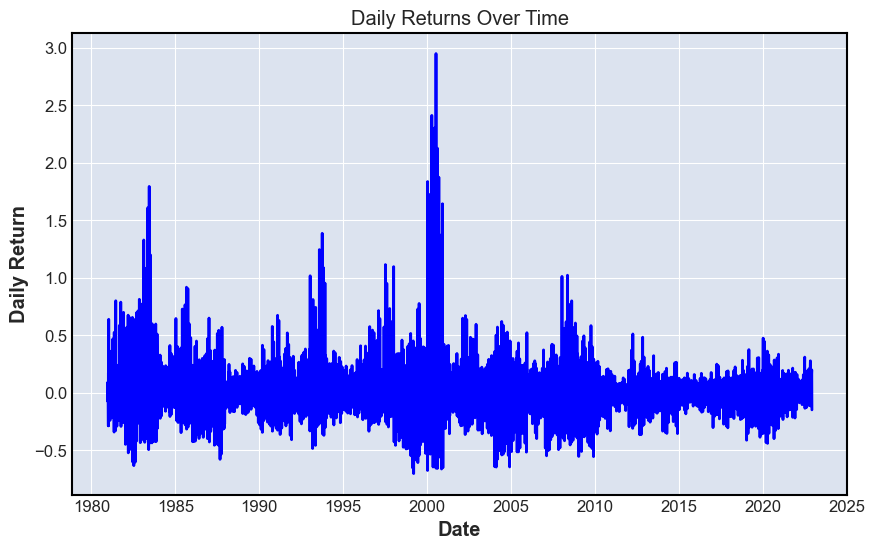

In [154]:
plt.figure(figsize=(10,6))
plt.plot(data.index, data['Daily Return'], color='blue', linewidth=2)
plt.title('Daily Returns Over Time')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.grid(True)
plt.show()

In [156]:
risk = data["Daily Return"].std()

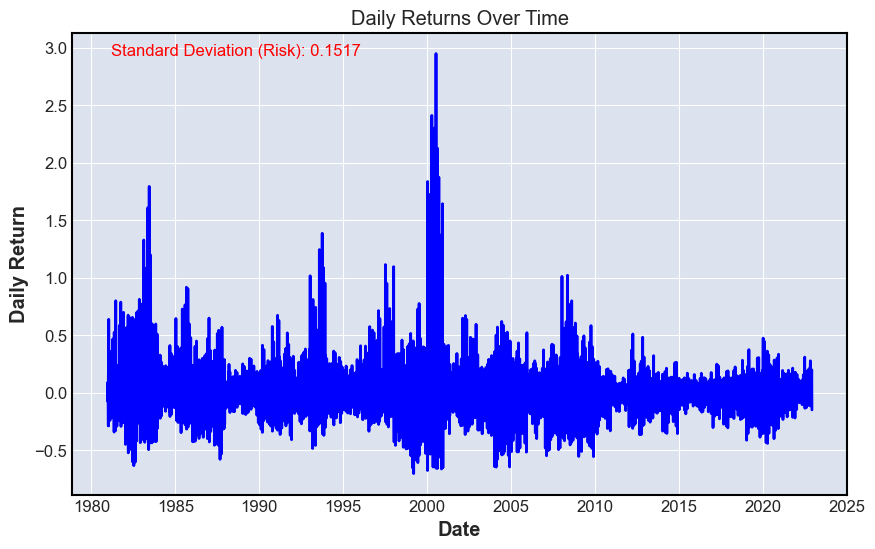

In [157]:
plt.figure(figsize=(10, 6))
plt.plot(data.index, data['Daily Return'], color= "blue", linewidth=2)
plt.title('Daily Returns Over Time')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.grid(True)

plt.annotate(f'Standard Deviation (Risk): {risk:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             fontsize=12, color='red')

plt.show()

In [158]:
mean = data['Daily Return'].mean()
mean

0.01083850482191925

Explanation: The mean return of 0.010 informs the user that the investment has a small positive daily return: which represents a relatively stable performance over time. The risk value of 0.157 represents the standard deviation of daily returns. It informs the user that the stock's daily returns show relatively moderate volatility

Outlier Detection

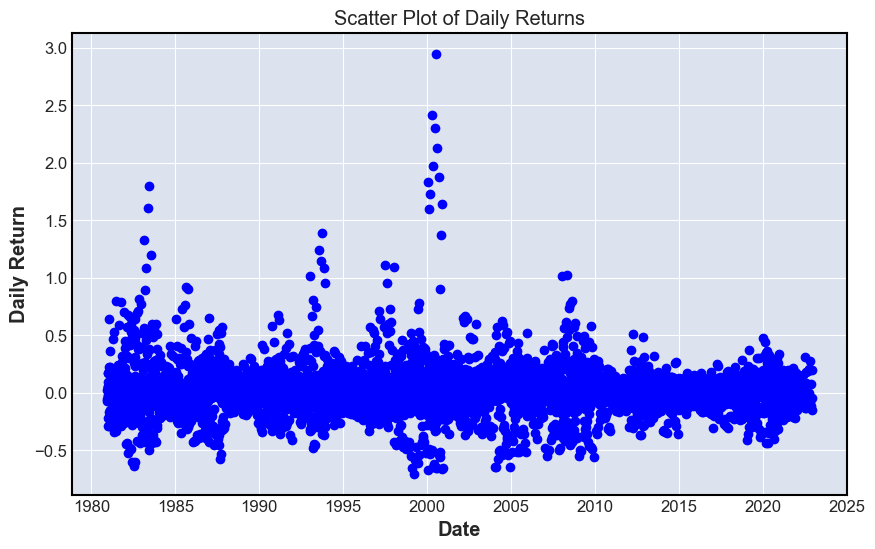

In [159]:
plt.figure(figsize=(10, 6))
plt.scatter(data.index, data['Daily Return'], color='blue')
plt.title('Scatter Plot of Daily Returns')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.grid(True)
plt.show()

In [160]:
!pip3 install statsmodels

In [161]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

In [162]:
path = "apple_stock_prices.csv"

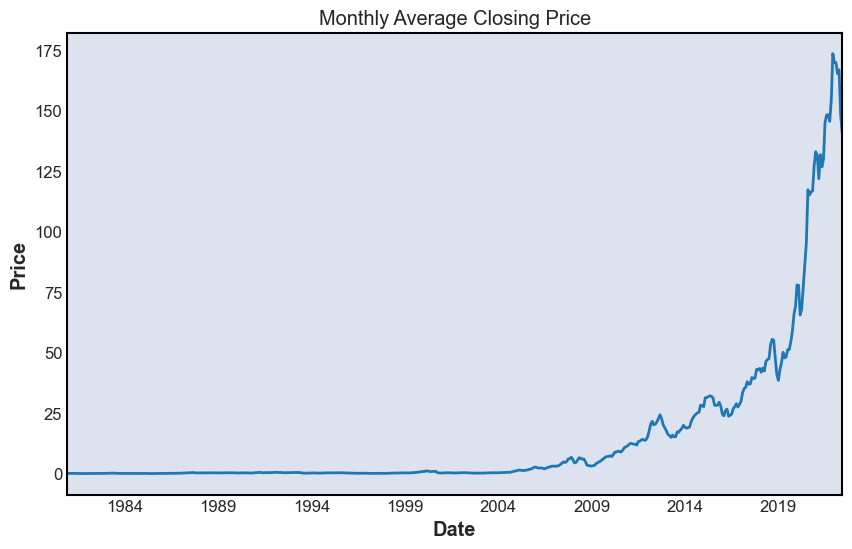

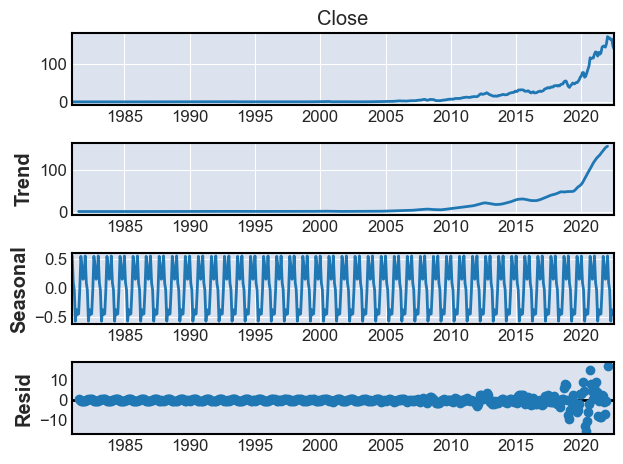

In [163]:
data = pd.read_csv ('apple_stock_prices.csv')
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')
data.set_index('Date', inplace=True)
monthly_data = data.resample('M').mean()
monthly_data['Close'].plot(figsize=(10,6))
plt.title('Monthly Average Closing Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(False)
plt.show()
result = seasonal_decompose(monthly_data['Close'], model='additive')
result.plot()
plt.grid(False)
plt.show()

What is observed in the Seasonal plot table is that the stock is constantly changing with the seasons. Every September Apple hosts an event where they launch their new products and the stock rises but as the new year hits, the stock starts to fall. It appears around the time that Q1 earnings are announced, ths stock starts to pick up and continue to rise for the rest of the year.

In [164]:
path = "S&P_500_Data.csv"

In [165]:
data = pd.read_csv('S&P_500_Data.csv')
data['Close'] = pd.to_numeric(data['Close'], errors='coerce')
data['Close'] = pd.to_numeric(data['Close'], errors='coerce')
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)
data['AAPL_Returns'] = data['Close'].pct_change()
data['SP500_Returns'] = data['Close'].pct_change()
correlation_coefficient = data['AAPL_Returns'].corr(data['SP500_Returns'])
print("Correlation coefficient between Apple and S&P 500 returns:", correlation_coefficient)

Correlation coefficient between Apple and S&P 500 returns: 1.0


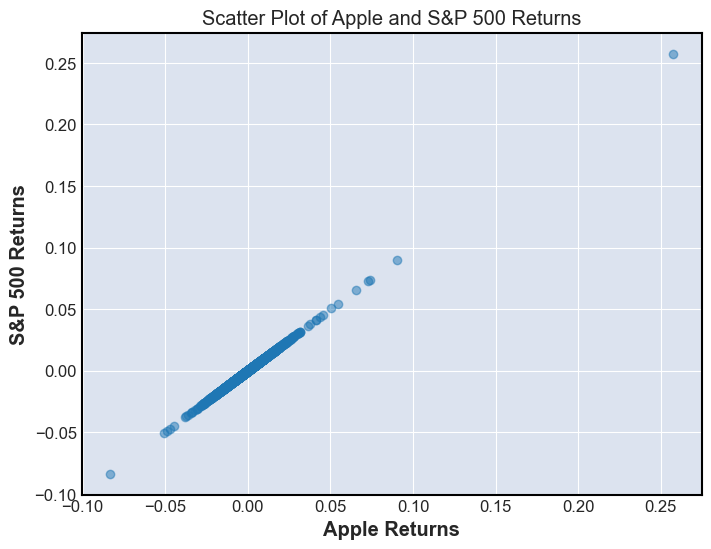

In [166]:
data = pd.read_csv('S&P_500_Data.csv')
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)
data['Close'] = pd.to_numeric(data['Close'], errors='coerce')
data['Close'] = pd.to_numeric(data['Close'], errors='coerce')
data['AAPL_Returns'] = data['Close'].pct_change()
data['SP500_Returns'] = data['Close'].pct_change()
plt.figure(figsize=(8, 6))
plt.scatter(data['AAPL_Returns'], data['SP500_Returns'], alpha=0.5)
plt.title('Scatter Plot of Apple and S&P 500 Returns')
plt.xlabel('Apple Returns')
plt.ylabel('S&P 500 Returns')
plt.grid(True)
plt.show()

What is observed in the above scatter plot, is that each point represents a pair of daily returns for Apple and S&P 500. The position of the points relative to the diagnal line represents the correlation between the two. Here you can observe that there are many points clustered along a straight line which indicates a strong correlation between the two. You can also see that there are a few points that are more spread out which indicate a weaker correlation between the two. After viewing this scatter plot and calculating the correlation coefficiecient, which came out to 1, it appears that there is a strong correlation between the S&P 500's performance and Apple's performance

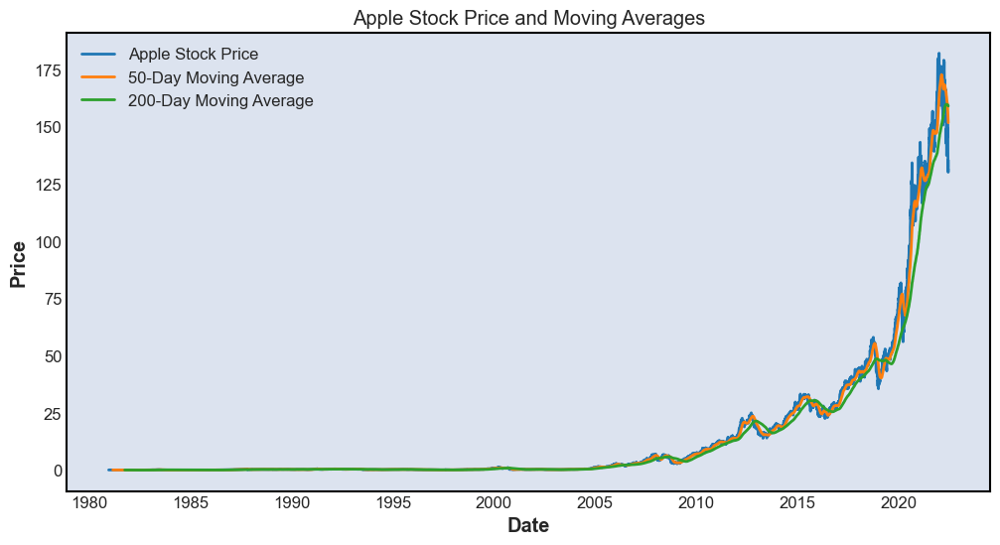

In [167]:
data = pd.read_csv('apple_stock_prices.csv')
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')
data.set_index('Date', inplace=True)
data['50_Day_MA'] = data['Close'].rolling(window=50).mean()
data['200_Day_MA'] = data['Close'].rolling(window=200).mean()
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['Close'], label='Apple Stock Price')
plt.plot(data.index, data['50_Day_MA'], label='50-Day Moving Average')
plt.plot(data.index, data['200_Day_MA'], label='200-Day Moving Average')
plt.title('Apple Stock Price and Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(False)
plt.legend()
plt.show()

What is observed in the Moving Averages graph is that the stock price was basically at the same rate as both the 50-Day and 200-Day Moving Averages from the start until around 2008. This could indicate that the market was in a period of balance and the amount of buyers and sellers of the stock matched which led to the lack of significant price movement. Also, traders could have been indecisive and wanted to test the waters to determine the stock's direction. From the period of about 2008 until 2021, the stock was higher than both Moving Averages. This could indicate that the stock is in an uptrend phase. This would also suggest that the stocks recent performance has been strong and the long-term trend is positive. From 2021 on, you will notice that the Moving Averages were higher than the stock price and this can indicate that the stock may see a downtrend which would suggest the recent performance of the stock has been weaker and is lagging behind its historical averages. Traders may interpret these moving averages as barries that the stock needs to overcome in order to regain bullish momentum.

In [168]:
import numpy as np


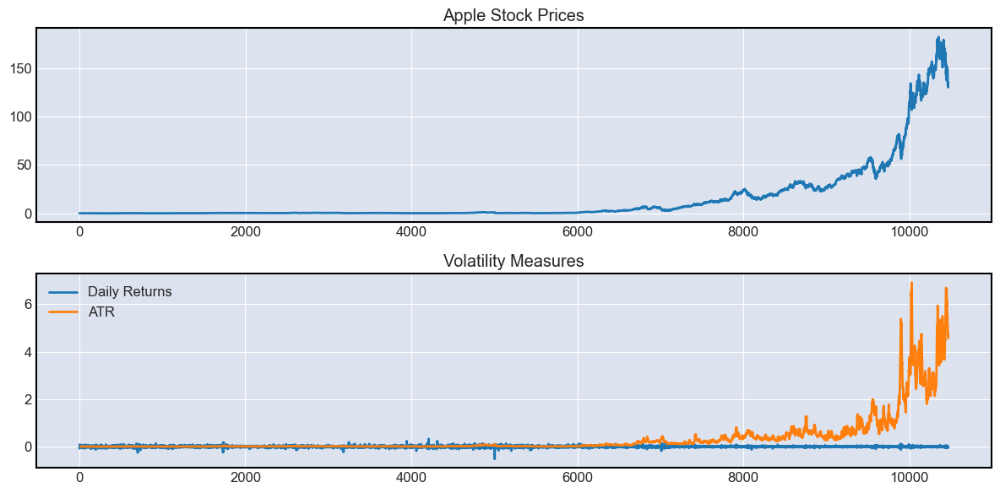

Standard Deviation (Volatility): 0.028352828029349082


In [169]:
data = pd.read_csv("apple_stock_prices.csv")

data["Daily_Return"] = data["Close"].pct_change()

volatility_std = data["Daily_Return"].std()

data["High_Low_Diff"] = data["High"] - data["Low"]
data["High_PreviousClose_Diff"] = np.abs(data["High"] - data["Close"].shift(1))
data["Low_PreviousClose_Diff"] = np.abs(data["Low"] - data["Close"].shift(1))
data["ATR"] = data[["High_Low_Diff", "High_PreviousClose_Diff", "Low_PreviousClose_Diff"]].max(axis=1).rolling(window=14).mean()

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(data["Close"])
plt.title("Apple Stock Prices")

plt.subplot(2, 1, 2)
plt.plot(data["Daily_Return"], label="Daily Returns")
plt.plot(data["ATR"], label="ATR")
plt.legend()
plt.title("Volatility Measures")

plt.tight_layout()
plt.show()

print("Standard Deviation (Volatility):", volatility_std)

A standard deviation of 0.02835282802934908 indicates the daily returns of Apple stock have exhibited relatively limited variability around their mean. This suggest that the stock's price movements have been relatively stable over the analyzed period. As you can see the Daily Returns and ATR were on the same horizontal line meaning that the stock was pretty consistent and predictable. Over time, the stock had gotten alittle more inconsistent and more unpredictable.

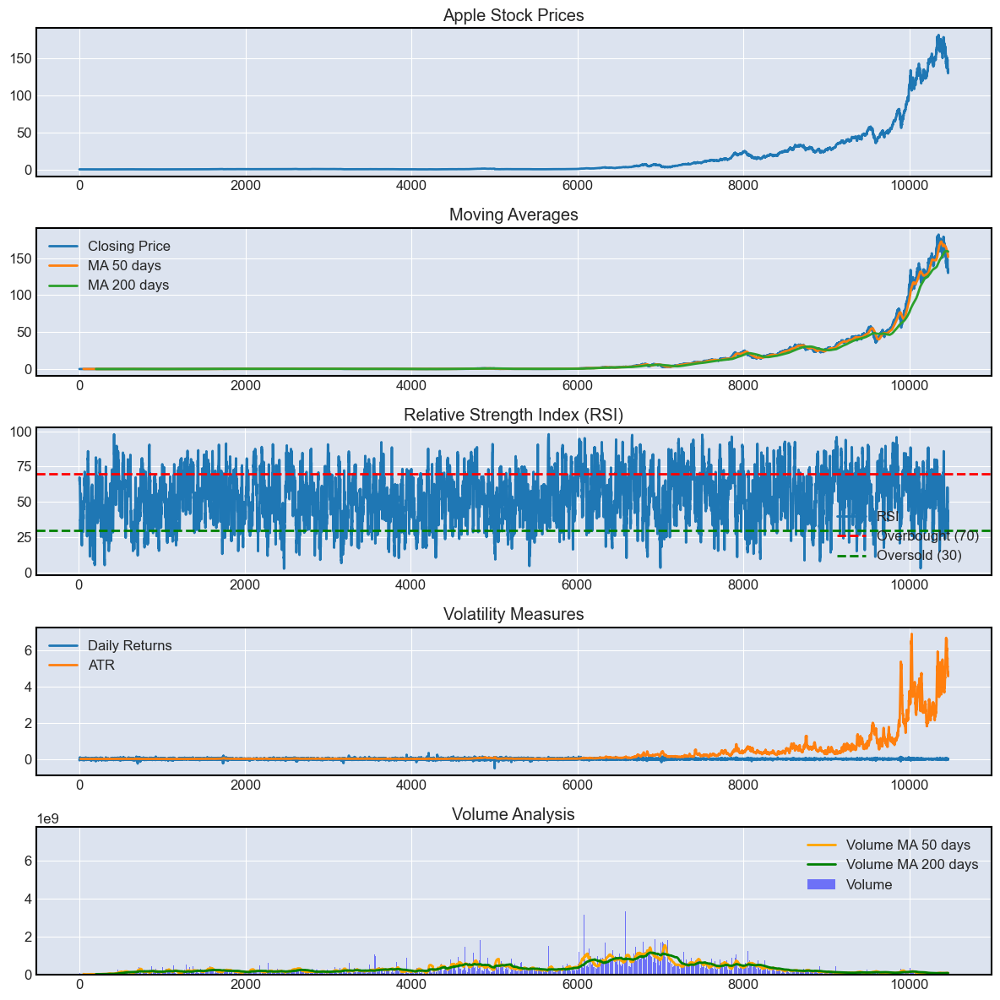

Standard Deviation (Volatility): 0.028352828029349082


In [170]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("apple_stock_prices.csv")

# Calculate Moving Averages (MA)
data["MA_50"] = data["Close"].rolling(window=50).mean()
data["MA_200"] = data["Close"].rolling(window=200).mean()

# Calculate Relative Strength Index (RSI)
def calculate_rsi(data, window=14):
    delta = data["Close"].diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(window=window).mean()
    avg_loss = loss.rolling(window=window).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

data["RSI"] = calculate_rsi(data)

# Calculate Daily Returns and ATR
data["Daily_Return"] = data["Close"].pct_change()
data["High_Low_Diff"] = data["High"] - data["Low"]
data["High_PreviousClose_Diff"] = np.abs(data["High"] - data["Close"].shift(1))
data["Low_PreviousClose_Diff"] = np.abs(data["Low"] - data["Close"].shift(1))
data["ATR"] = data[["High_Low_Diff", "High_PreviousClose_Diff", "Low_PreviousClose_Diff"]].max(axis=1).rolling(window=14).mean()

# Volume Analysis
data["Volume_MA_50"] = data["Volume"].rolling(window=50).mean()
data["Volume_MA_200"] = data["Volume"].rolling(window=200).mean()

# Plotting
plt.figure(figsize=(12, 12))

#Plot Apple stock
plt.subplot(5, 1, 1)
plt.plot(data["Close"])
plt.title("Apple Stock Prices")

# Plot Stock Prices and Moving Averages
plt.subplot(5, 1, 2)
plt.plot(data["Close"], label="Closing Price")
plt.plot(data["MA_50"], label="MA 50 days")
plt.plot(data["MA_200"], label="MA 200 days")
plt.legend()
plt.title("Moving Averages")

# Plot RSI
plt.subplot(5, 1, 3)
plt.plot(data["RSI"], label="RSI")
plt.axhline(y=70, color='r', linestyle='--', label="Overbought (70)")
plt.axhline(y=30, color='g', linestyle='--', label="Oversold (30)")
plt.legend()
plt.title("Relative Strength Index (RSI)")

# Plot Daily Returns and ATR
plt.subplot(5, 1, 4)
plt.plot(data["Daily_Return"], label="Daily Returns")
plt.plot(data["ATR"], label="ATR")
plt.legend()
plt.title("Volatility Measures")

# Plot Volume and Volume Moving Averages
plt.subplot(5, 1, 5)
plt.bar(data.index, data["Volume"], label="Volume", color='blue', alpha=0.5)
plt.plot(data["Volume_MA_50"], label="Volume MA 50 days", color='orange')
plt.plot(data["Volume_MA_200"], label="Volume MA 200 days", color='green')
plt.legend()
plt.title("Volume Analysis")

plt.tight_layout()
plt.show()


print("Standard Deviation (Volatility):", data["Daily_Return"].std())


Standard deviation is commonly used as a measure of volatility in financial analysis, especially when dealing with price movements. It's a statistical measure that quantifies the amount of dispersion or variability of a set of data points from the mean (average). In the context of financial markets and stock prices, volatility refers to the magnitude of price fluctuations over a specific period of time. Here's why standard deviation is used for volatility analysis. On the other hand, technical indicators and volume analysis focus on other aspects of market behavior, such as trends, momentum, and trading activity, which don't necessarily require measuring variability through standard deviation.

Breakdown of each factor based on theBreakdown of each factor based on the code provided:

### 1. Moving Averages (MA):

- Moving averages smooth out price data over a specific period of time to identify trends and eliminate short-term     fluctuations.
- The 50-day and 200-day moving averages are commonly used in technical analysis to identify long-term and intermediate trends.
- When the price crosses above the MA, it could signal a potential upward trend, and vice versa.

### 2. Relative Strength Index (RSI):

- RSI is a momentum oscillator that measures the speed and change of price movements.
- RSI values above 70 are considered overbought, suggesting a potential price reversal or correction.
- RSI values below 30 are considered oversold, suggesting a potential upward reversal.

### 3. Daily Returns:

- Daily returns represent the percentage change in the closing price from one day to the next.
- It provides insight into how much the price changes from day to day, indicating short-term volatility.
- Positive returns suggest price increases, while negative returns suggest price decreases.

### 4.Average True Range (ATR):

- ATR measures volatility by considering the range between high and low prices along with the previous day's close.
- It provides an average of the largest of the following three values: high-low range, high-previous close, low-previous close.
- A higher ATR value indicates higher volatility, while a lower value suggests lower volatility.

### 5. Volume Analysis:

- Volume reflects the number of shares or contracts traded during a specific time period.
- It's used to confirm the strength of price movements: higher volume during price increases indicates strong buying interest.
- Volume moving averages (MA) smooth out volume data to identify trends in trading activity.





